# Predicting Airbnb Listing Prices in Boston

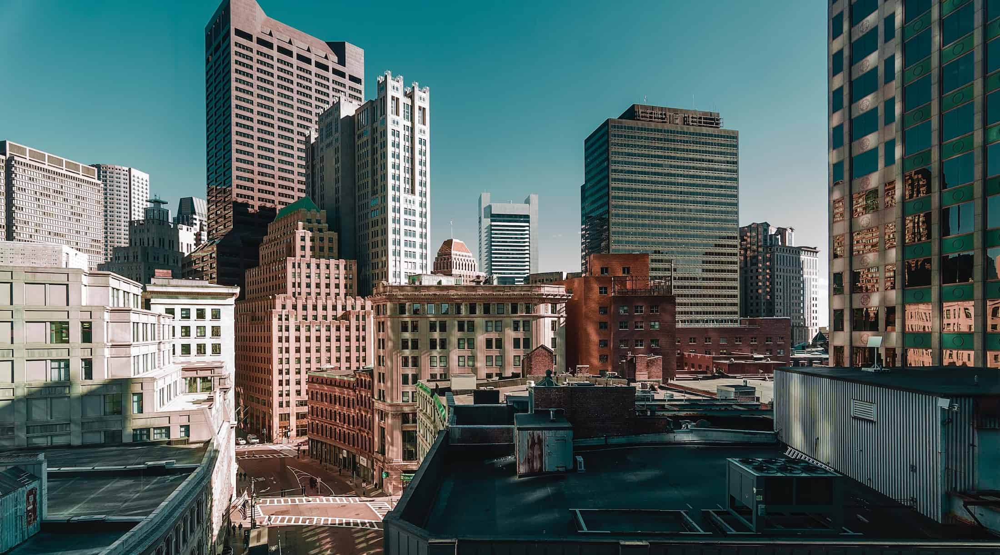

## Table of Contents

1. [Business Understanding](#business_understanding)
<br>    1.1. [Introduction](#introduction)
2. [Data Understanding](#data_understanding)
<br>    2.1. [Import Packages](#import_packages)
<br>    2.2. [Gather Data](#gather_data)
<br>    2.3. [Drop variables unrelated to price for modelling](#2.3)
<br>    2.4. [Fix data types related to price](#2.4)
<br>    2.5. [Drop missing data](#2.5)
<br>    2.6. [Price distribution](#2.6)
<br>    2.7. [Removing outliers](#2.7)
<br>    2.8. [Mapbox Scatter Plot](#2.8)
<br>    2.9. [Numerical variable analysis](#2.9)
<br>    2.10. [Categorical variable analysis](#2.10)
<br>    2.11. [Data Understanding Results](#2.11)
3. [Data Preperation](#data_preperation)
<br>    3.1. [Numerical variable selection](#3.1)
<br>    3.2. [Categorical variable selection](#3.2)
<br>    3.3. [Prepare data for Machine Learning](#3.3)
4. [Model Data](#model_data)
<br>    4.1. [Price Prediction](#price_prediction)
<br>    4.2. [Review Prediction](#review_prediction)
5. [Results](#results)
<br>    5.1. [Q1: Can we find out if a review will be positive or negative based on just text?](#q1)
<br>    5.2. [Q2: What factors can affect listing prices?](#q2)
<br>    5.3. [Q3. How do those factors affect listing prices?](#q3)
6. [Deploy](#deploy)

<a id='business Understanding'></a>
## 1. Business Understanding

Airbnb is a popular way for home owners to make money by renting out their properties or even spare rooms in their own home. More people are considering joining Airbnb to profit by investing in new properties to transform into Airbnbs. However, how will they know what to consider to make their property an attractive proposition for customers? How will they identify which variables can increase their listing price and profit?

There is a problem though, you see. Hosts remove their listings for various reasons such as a lack of bookings or if the property is currently occupied. This means we must find a way to predict that data and recommend them a reasonable price so they can attract more guests. Before we can answer those questions, we need to find relevant variables to use.

Since 2008, guests and hosts have used Airbnb to travel in a more unique, personalized way. As part of the Airbnb Inside initiative, this dataset describes the listing activity of homestays in Boston, MA and Seattle, WA. We will use the CRISP-DM process to work through this project, CRISP-DM stands for cross-industry process for data mining. The first stage of the CRISP-DM process is to understand what we want to accomplish from a business perspective.

<a id='introduction'></a>
### 1.1. Introduction

#### Project resources

https://www.kaggle.com/airbnb/boston<br>
https://www.kaggle.com/airbnb/seattle

The following Airbnb activity is included in these datasets:

- listings: including full descriptions and average review score
- reviews: including unique id for each reviewer and detailed comments
- calendar: including listing id and the price and availability for that day

#### Business Objectives

How can we find the best location to start our new Airbnb?
1. Can we find out if a review will be positive or negative based on just text?
2. What factors can affect listing prices?
3. How do those factors affect listing prices?

#### Project Plans

Our plan to achieve the data mining and business goals is to use a Jupiter Notebook as the method of handling our project. We will use:

- Python 3 and packages such as Pandas, NumPy to handle dataframes
- Matplotlib and Seaborn to plot visualisations of our findings
- Plotly to display interactive dashboards and to show map data with overlays
- Scikit-learn packages to perform machine learning operations

<a id='data_understanding'></a>
## 2. Data Understanding

<a id='import_packages'></a>
### 2.1. Import Packages

In [1]:
# import packages
import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import calendar
import plotly.express as px
import random

# import ml packages
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Ridge, RidgeCV
from sklearn.metrics import r2_score, mean_squared_error

In [2]:
# display options for increasing row and column count
pd.set_option('display.max_rows', None, 'display.max_columns', None)
# reset options
#pd.reset_option('^display.', silent=True)
# set plot style
sns.set_style("whitegrid")

<a id='gather_data'></a>
### 2.2. Gather Data

**Gather necessary data to answer our questions:**<br>
We have imported the libraries we need above. We will gather data we downloaded from Kaggle for Airbnb in the form of csv files. The next step is to use `pd.read_csv()` to import our data into pandas as dataframes.

In [3]:
# Read CSV (comma-separated) file into DataFrame - Boston
bos_cal = pd.read_csv(r'data/boston_airbnb_open_data/calendar.csv')
bos_list = pd.read_csv(r'data/boston_airbnb_open_data/listings.csv')
bos_rev = pd.read_csv(r'data/boston_airbnb_open_data/reviews.csv')

# Read CSV (comma-separated) file into DataFrame - Seattle (Optional)
sea_cal = pd.read_csv(r'data/seattle_airbnb_open_data/calendar.csv')
sea_list = pd.read_csv(r'data/seattle_airbnb_open_data/listings.csv')
sea_rev = pd.read_csv(r'data/seattle_airbnb_open_data/reviews.csv')

<blockquote> 
<b>Quality:</b> issues with content. Low quality data is also known as dirty data. <br>
<b>Tidiness:</b> issues with structure that prevent easy analysis. Untidy data is also known as messy data.<br>
    <b>Tidy data requirements:</b>
Each variable forms a column.
Each observation forms a row.
Each type of observational unit forms a table.
</blockquote>

In [4]:
# show df
bos_list.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,12147973,https://www.airbnb.com/rooms/12147973,20160906204935,2016-09-07,Sunny Bungalow in the City,"Cozy, sunny, family home. Master bedroom high...",The house has an open and cozy feel at the sam...,"Cozy, sunny, family home. Master bedroom high...",none,"Roslindale is quiet, convenient and friendly. ...",NaN,"The bus stop is 2 blocks away, and frequent. B...","You will have access to 2 bedrooms, a living r...",NaN,Clean up and treat the home the way you'd like...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,https://a2.muscache.com/im/pictures/c0842db1-e...,31303940,https://www.airbnb.com/users/show/31303940,Virginia,2015-04-15,"Boston, Massachusetts, United States",We are country and city connecting in our deck...,NaN,NaN,NaN,f,https://a2.muscache.com/im/pictures/5936fef0-b...,https://a2.muscache.com/im/pictures/5936fef0-b...,Roslindale,1,1,"['email', 'phone', 'facebook', 'reviews']",t,f,"Birch Street, Boston, MA 02131, United States",Roslindale,Roslindale,NaN,Boston,MA,02131,Boston,"Boston, MA",US,United States,42.282619,-71.133068,t,House,Entire home/apt,4,1.5,2.0,3.0,Real Bed,"{TV,""Wireless Internet"",Kitchen,""Free Parking ...",NaN,$250.00,NaN,NaN,NaN,$35.00,1,$0.00,2,1125,2 weeks ago,NaN,0,0,0,0,2016-09-06,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,NaN,f,moderate,f,f,1,NaN
1,3075044,https://www.airbnb.com/rooms/3075044,20160906204935,2016-09-07,Charming room in pet friendly apt,Charming and quiet room in a second floor 1910...,Small but cozy and quite room with a full size...,Charming and quiet room in a second floor 1910...,none,"The room is in Roslindale, a diverse and prima...","If you don't have a US cell phone, you can tex...",Plenty of safe street parking. Bus stops a few...,Apt has one more bedroom (which I use) and lar...,"If I am at home, I am likely working in my hom...",Pet friendly but please confirm with me if the...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,https://a1.muscache.com/im/pictures/39327812/d...,2572247,https://www.airbnb.com/users/show/2572247,Andrea,2012-06-07,"Boston, Massachusetts, United States",I live in Boston and I like to travel and have...,within an hour,100%,100%,f,https://a2.muscache.com/im/users/2572247/profi...,https://a2.muscache.com/im/users/2572247/profi...,Roslindale,1,1,"['email', 'phone', 'facebook', 'linkedin', 'am...",t,t,"Pinehurst Street, Boston, MA 02131, United Sta

<a id='2.3'></a>
### 2.3. Drop variables unrelated to price for modelling

In [5]:
# drop columns from listings df unrelated to price
dropcol = ['id', 'host_id', 'listing_url', 'scrape_id', 'jurisdiction_names', 'license','thumbnail_url',
           'medium_url', 'picture_url', 'xl_picture_url', 'host_thumbnail_url', 'host_picture_url']
listings = bos_list.copy().drop(dropcol, axis=1)
listings.shape

(3585, 83)

<a id='2.4'></a>
### 2.4 Fix data types related to price

In [6]:
# observe price columns
price_cols = listings[['price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'extra_people']]
price_cols.head()

,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people
0,$250.00,NaN,NaN,NaN,$35.00,$0.00
1,$65.00,$400.00,NaN,$95.00,$10.00,$0.00
2,$65.00,$395.00,"$1,350.00",NaN,NaN,$20.00
3,$75.00,NaN,NaN,$100.00,$50.00,$25.00
4,$79.00,NaN,NaN,NaN,$15.00,$0.00


In [7]:
# creating a function to list columns
def col_list(col_name):
    for col in col_name:
        print(col)

In [8]:
# creating an index from columns
price_cols_index = price_cols.columns
col_list(price_cols)

price
weekly_price
monthly_price
security_deposit
cleaning_fee
extra_people


**Observation:** We can see we have some `$` signs which we need to remove before we convert the columns to integers.

In [9]:
# remove strings from column names then convert data types to float
for string in price_cols_index:
    listings[string] = listings[string].map(lambda x: x.replace('$', '').replace(',', '').replace(' ', ''), na_action = 'ignore')
    listings[string] = listings[string].astype(float)

listings[price_cols_index].head()

,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people
0,250.0,NaN,NaN,NaN,35.0,0.0
1,65.0,400.0,NaN,95.0,10.0,0.0
2,65.0,395.0,1350.0,NaN,NaN,20.0
3,75.0,NaN,NaN,100.0,50.0,25.0
4,79.0,NaN,NaN,NaN,15.0,0.0


In [10]:
# observe rating columns
rating_cols = listings[['host_response_rate', 'host_acceptance_rate']]
rating_cols.head()

,host_response_rate,host_acceptance_rate
0,NaN,NaN
1,100%,100%
2,100%,88%
3,100%,50%
4,100%,100%


In [11]:
# creating an index from columns
rating_cols_index = rating_cols.columns
col_list(rating_cols_index)

host_response_rate
host_acceptance_rate


**Observation:** We can see we have some `%` signs which we need to remove before we convert the columns to integers.

In [12]:
# remove % from column names then convert data types to float
for pct in rating_cols_index:
    listings[pct] = listings[pct].map(lambda x: x.replace('%', '').replace(',', '').replace(' ', ''), na_action = 'ignore')
    listings[pct] = listings[pct].astype(float)

listings[rating_cols_index].head()

,host_response_rate,host_acceptance_rate
0,NaN,NaN
1,100.0,100.0
2,100.0,88.0
3,100.0,50.0
4,100.0,100.0


<a id='2.5'></a>
### 2.5. Drop missing data

We can follow two rules here to help us deal with missing data:
- If the price value is missing, we should drop the row since it is not useful to us predicting the value.
- If any column we need to use has more than 50% of missing data we should drop that column. If most of the data is missing then it will reduce the accuracy of our model.

In [13]:
# drop rows with missing price data
listings_dropna = listings.dropna(subset=['price'], axis=0)

# filter the columns with more than 50% data missing
null_cols = listings.columns[listings.isnull().mean() > .5]

print("\033[1m" + 'Columns with more than 50% data missing:' + "\033[0m")
col_list(null_cols)

# drop the columns with more than 50% data missing
listings_dropna = listings.drop(null_cols, axis=1)
listings_dropna.shape

Columns with more than 50% data missing:
notes
neighbourhood_group_cleansed
square_feet
weekly_price
monthly_price
security_deposit
has_availability


(3585, 76)

<a id='2.6'></a>
### 2.6. Price distribution

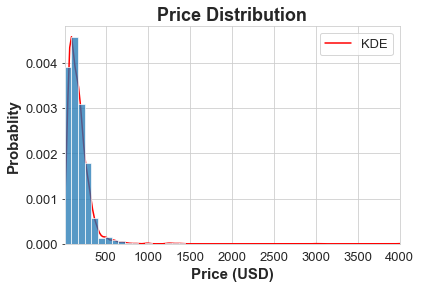

count    3585.000000
mean      173.925802
std       148.331321
min        10.000000
25%        85.000000
50%       150.000000
75%       220.000000
max      4000.000000
Name: price, dtype: float64

In [14]:
# histogram plot to see the price distribution
df = listings_dropna['price']
fig, ax1 = plt.subplots()
sns.kdeplot(data=df, color='red', fill=False, ax=ax1)
ax1.set_xlim((df.min(), df.max()))
ax2 = ax1.twinx()
sns.histplot(data=df, bins=50, discrete=False, ax=ax2)

# plot design
title = 'Price Distribution'; xlabel = 'Price (USD)'; ylabel = 'Probablity'
plt.title(title, weight='bold', fontsize=18)
ax1.set_xlabel(xlabel, weight='bold', fontsize=15)
ax1.set_ylabel(ylabel, weight='bold', fontsize=15)
ax1.legend(['KDE'], prop={"size":13})
ax1.tick_params(labelsize=13)
ax2.grid(False)
ax2.axis('off')
plt.show()

# price statistics
listings_dropna.describe().price

**Observation:** We can see 75% of prices are below 220 USD but from the plot we can see some prices rise to around 500-600 on average. The max value of 4000 USD is clearly an outlier if we look at the plot. Generally, prices can range from roughly 20 to 500 USD which is acceptable for an Airbnb listing price.

<a id='2.7'></a>
### 2.7. Removing outliers

Since we found some outliers in our previous exploration we need to remove those. It is not a realistic representation of most Airbnb prices. Some outliers saw some properties listed as high as 4000 USD but also as low as just 10 USD, both very rare situations. The listings above 500 USD should be removed as the prices there are not very common. 

In [15]:
# remove outliers and keep only prices within 20 to 500 USD
listings_out = listings_dropna[(listings_dropna['price'] >20)
                               & (listings_dropna['price'] <500)]

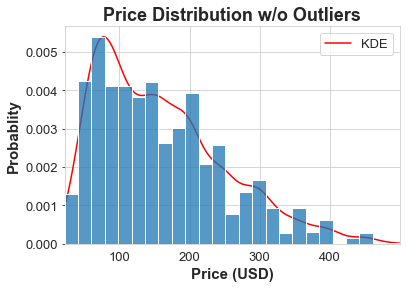

count    3491.000000
mean      159.668863
std        90.922800
min        22.000000
25%        85.000000
50%       147.000000
75%       210.000000
max       499.000000
Name: price, dtype: float64

In [16]:
# histogram plot to see the price distribution
df = listings_out['price']
fig, ax1 = plt.subplots()
sns.kdeplot(data=df, color='red', fill=False, ax=ax1)
ax1.set_xlim((df.min(), df.max()))
ax2 = ax1.twinx()
sns.histplot(data=df, bins=25, discrete=False, ax=ax2)

# plot design
title = 'Price Distribution w/o Outliers'; xlabel = 'Price (USD)'; ylabel = 'Probablity'
plt.title(title, weight='bold', fontsize=18)
ax1.set_xlabel(xlabel, weight='bold', fontsize=15)
ax1.set_ylabel(ylabel, weight='bold', fontsize=15)
ax1.legend(['KDE'], prop={"size":13})
ax1.tick_params(labelsize=13)
ax2.grid(False)
ax2.axis('off')
plt.show()

# price statistics
listings_out.describe().price

<a id='2.8'></a>
### 2.8. Mapbox Scatter Plot

In [17]:
# initalizing plotly mapbox
df = listings_out
color = px.colors.cyclical.Phase
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="price", size="price",
                  color_continuous_scale=px.colors.sequential.Reds, size_max=10, zoom=10,
                  mapbox_style="carto-positron", title="Airbnb Prices around Boston")

# save fig
fig.write_html("px_boston_prices.html")
fig.show()

**Observation:** As no surprise, we can notice the prices increase as we go towards the city center and waterfont. The suburbs have low prices since there is not as much demand for those areas.

<a id='2.9'></a>
### 2.9. Numerical variable analysis

A numerical variable is a data variable that takes on any value within a finite or infinite interval (e.g. length, test scores, etc.). A numerical variable can also be called a continuous variable because it exhibits the features of continuous data. Unlike discrete data, continuous data takes on both finite and infinite values.

**Adding our first numerical variable:** `bedrooms`
Bedrooms are one of the most important factors that affect the price of a property. We can work with the data below.

In [18]:
# filtering the listings between 20 to 500 USD
listings_new = listings_dropna[(listings_dropna['price'] > 20) & 
                               (listings_dropna['price'] < 500)].copy()
print(listings_new.shape)

# print bedrooms
bedrooms_col = listings_new['bedrooms']
bedrooms_col.head()

(3491, 76)


0    2.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: bedrooms, dtype: float64

#### Imputing missing numerical values

We will fill the missing data with the mean value, this is one of the most frequently used methods of imputing in data science. Next, we will convert the floats to integers for the `bedrooms` column as there is no use for decimal places to count bedrooms.

In [19]:
# impute mean of bedrooms to nan values
bedrooms_col = bedrooms_col.fillna(bedrooms_col.mean()).astype(int)

# filter numerical variables then drop variables that do not affect price
num_cols = listings_new[listings_new.select_dtypes(include=['float64', 'int64']).columns]
num_cols = num_cols.drop(['latitude', 'longitude'], axis=1)

# fill the nan values with mean then check nan counts
num_cols = num_cols.apply(lambda col: col.fillna(col.mean()), axis=0)

#### Heatmap

In this step, we need to visualise correlations between the numerical variables. The correlation between the variables should be ordered in descending order and the darkness of the colour indicates whether the effect of price is positive or negative.

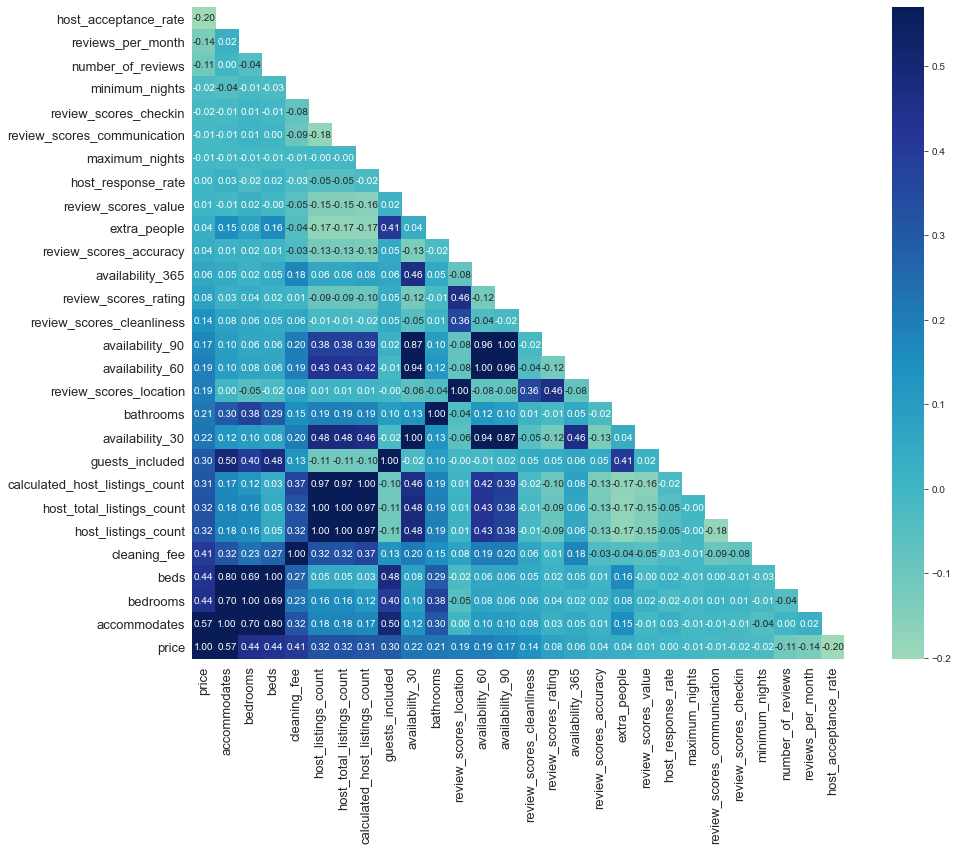

In [20]:
# heatmap
num_cols = num_cols.drop(['price'], axis=1)
num_cols = pd.concat([num_cols, listings_new['price']], axis=1)
corr = num_cols.corr().sort_values('price', axis=1, ascending=False)
corr = corr.sort_values('price', axis=0, ascending=True)
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask, k=1)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(17, 12))
    ax = sns.heatmap(corr, mask=mask, vmin=corr.price.min(), 
                     vmax=corr.drop(['price'], axis=0).price.max(), center=0, square=True, 
                     annot=True, fmt='.2f',cmap='YlGnBu',annot_kws={"size": 10})

# increase tick label size
ax.tick_params(labelsize=13)

**Observations:** Similar numerical variables show similarly high correlations such as: 
- `host_listings_count`, `host_total_listings_count`, `calculated_host_listings_count`
- `availibility_30`, `availibility_60`, `availibility_90`, `availibility_365`
- `review_scores_location`, `review_scores_cleanliness`, `review_scores_accuracy`, etc.

Other numerical variables show a strong correlation to price such as:
- `accommodates`, `bedrooms`, `beds`, `cleaning fee`

<a id='2.10'></a>
### 2.10. Categorical variable analysis

Categorical data is a collection of information that is divided into groups. For example, if an organisation is trying to get a data of its employees, the resulting data is referred to as categorical. This data is called 'categorical' because it may be grouped according to the variables present in the data such as sex, relationship status, etc. Categorical data can take on numerical or boolian values such as “1” indicating Yes and “2” indicating No. However, those numbers don’t have mathematical siginificance. We can't add them together or subtract them from each other. 

**Adding our categorigal variables:** `neighbourhood_cleansed`, `property_type`, `room_type`, `bed_type`, `host_is_superhost`, `instant_bookable`, `cancellation_policy`, `require_guest_phone_verification`, `require_guest_profile_picture`, `is_location_exact`
We have selected the above factors as I believe those are some of the most important factors that affect the price of a property. Let's see if we can work with the data below.

In [21]:
# creating a function that creates a box plot for each categorical cat_cols
def cat(df, cat_cols, response):
    
    '''
    INPUT:
    df - pandas dataframe with categorical columns we want to use
    cat_cols - list of strings that are associated with names of the categorical columns
    response - dependent cat_cols used for our output result
    
    OUTPUT:
    none
    '''
    # plot
    pos = listings_new.groupby(cat_cols)[response].median().sort_values(ascending=False).index
    sns.boxplot(y=listings_new[cat_cols], x=listings_new[response], order=pos)
    ax = plt.gca()
    
    # plot design
    plt.title('{}'.format(cat_cols), weight='bold', fontsize=18, pad=15)
    plt.ylabel('',  weight='bold', fontsize=15)
    plt.xlabel('Price',  weight='bold', fontsize=15)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(False)

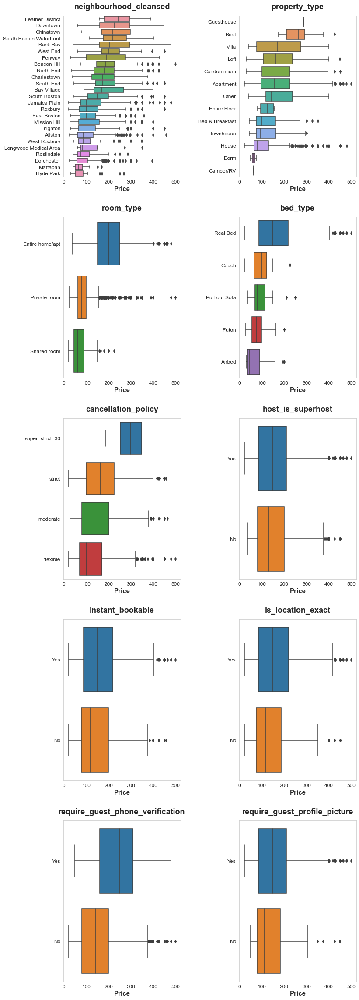

In [22]:
# assigning our categorical variables and plotting our box plots
cat_cols_index = ['neighbourhood_cleansed', 'property_type', 'room_type', 'bed_type', 
                  'cancellation_policy', 'host_is_superhost', 'instant_bookable', 
                  'is_location_exact', 'require_guest_phone_verification',
                  'require_guest_profile_picture']

# plotting our subplots using a for loop
f = plt.figure(figsize = (35, 15))
for i in range(len(cat_cols_index)):
    f.set_figheight(35)
    f.set_figwidth(12)
    cat_col_index = cat_cols_index[i]
    plt_index = i+1
    plt.subplot(5,2, plt_index)
    cat(df = listings_new, cat_cols=cat_col_index, response='price') 
    plt.subplots_adjust(hspace=0.25, wspace=0.50, top=1)
    
    # creating a label for each column
    if cat_col_index in ['host_is_superhost', 'instant_bookable', 'is_location_exact', 
                         'require_guest_phone_verification', 'require_guest_profile_picture']:
        locs, labels = plt.xticks()
        labels = [item.get_text() for item in labels]
        
        # printing our labels
        if labels ==  ['f', 't']:
            plt.yticks(np.arange(2), ('No', 'Yes'))
        else:
            plt.yticks(np.arange(2), ('Yes', 'No'))

**Observations:** 
- **Neighbourhood:** The highest priced properties seem to be located in Leather District, Downtown, Chinatown and South Boston Waterfront. If we look on the map we can see they are located near the business district, with shops and resturants dotted around the waterfront.
- **Property type:** Boats tend to list for higher prices than houses but Villas seem to have the most variance in price. We also observed Houses, Dorms and Camper Vans have the lowest prices, probably because they are located in the suburbs. Houses also have the highest variance in terms of outliers.
- **Room type:** As a surprise to no one we can see that an entire house has a higher listing price to a private or shared room.
- **Bed type:** Real beds by far correlate to higher listing prices so we can comfortably say comfort is king!
- **Cancellation policy:** The lowest priced properties have the most flexibility in terms of cancellation policies.
- **Host is superhost:** Superhosts are experienced hosts who provide a shining example for other hosts, and extraordinary experiences for their guests. Superhosts charge slightly more than others but the difference is almost negligible.
- **Instant bookable:** It seems 'instant bookable' properties have a slighly higher price than non-instant bookable properties.
- **Is location exact:** Properties with exact locations in their listings fetch for higher prices
- **Require guest verification** Properties that require guest phone verification tend to go for higher prices
- **Require guest profile picture** Properties that require guest profile pictures tend to go for higher prices

<a id='2.11'></a>
### 2.11. Data Understanding Results

Through analysis of the categorical variables above, we see all the factors that affect the listing price. As an aspiring Airbnb host, a few factors can be taken into consideration to increase the listing price. From our observations above we can conclude:
- **Location, location, location:** Location has a significant factor on price. The further out we go from the city center and its amenities we have to accept the price will fall due to lower demand. Also, remember that providing accurate descriptions can help your property stand out from the rest. Try to explain what makes it unique and why?
- **People don't like sharing much:** We can see that most people opt for an entire home over a private room only. It seems people will pay more regardless to get more privacy as the cost savings are significant with private rooms.
- **Comfort is king:** Comfort is so important to customers and should be the primary focus once the above factors have been satisfied. The type and size of the bed can affect the quality of a customers sleep and overall experience, we can look into this more when we use NLP to look at review sentiment. The listing should include details such as the type of bed and the comfort that can be expected to increase customer interest.
- **Experience is key:** Experienced Airbnb owners called 'Superhosts' can charge more than ones that aren't. They may also provide better services such as providing information on Boston's local culture or history or, personalising their customers experiences which could attract more business.

If you want to invest an Airbnb home you should first pay attention to the Neighborhoood based on your budget. Next, you must consider the four factors listed above, also within budget: 

- Location and accurate description
- Privacy
- Comfort
- Experience

The other factors we need to look at may or may not increase your listing price as the potential profit increase is marginal:

- Cancellation policy
- Instant bookable
- Guest profile picture

The cancellation policy may have a relationship with luxury properties which explains the increase in price. It also makes sense since the more expensive a property is to rent the more money it loses sitting vacant. This is probably not something that will increase our profit.

Instant bookable homes tend to have a slighly higher price but the difference is negligable. I could indicate that less cleaning and preperation is needed for those homes if they are smaller apartments. Most of these factors can be useful for our price prediction.

<a id='data_preparation'></a>
## 3. Data Preparation

To prepare our data we must select variables with a high correlation to price in order to build a more accurate model. We also need to pay attention the total numbers of the selected variables. Selecting too few variables may not achieve high accuracy, while selecting too many variables may cause overfitting. In this section, we will select the top 15 numerical variables what a high correlation to our response `price` to use for our price prediction. Dummy variables will be created for the selected categorical variables with 0, 1 encodings. A total of 20 dummy variables with the highest correlations to price will be obtained to be used for the initial modeling.

In [23]:
# creating a function that selects variables according to their correlation to price
def select_var(df, response, num_variables, dropped_variables):
    '''
    INPUT:
    df - pandas dataframe, holding all the variables interested
    response - dependent column used for our output result
    num_variables - int, number of varibles to be used for modelling
    dropped_variables - list of variables to be dropped
    

    OUTPUT:
    variables - pandas dataframe, output of the selected variables based on correlation with response
    '''
    
    corr_num = df.corr()[response].abs().sort_values(ascending=False).drop(dropped_variables)[:num_variables]
    variables = df[corr_num.index]
    
    return variables

<a id='3.1'></a>
### 3.1. Numerical variable selection

Based on our heatmap plot for [numerical variables](#2.9), the variables with the highest correlation will be removed. The top 15 numerical variables based on their correlation price will selected for our price prediction.

#### Select the top 15 numerical variables

In [24]:
# select top 15 numerical variables based on absolute correlation then drop the mutually high correlated variables
response = 'price'
no_num_variables = 15
high_correlated_variables  = ['price', 'host_total_listings_count',
                             'calculated_host_listings_count', 'availability_60',
                             'availability_90']
num_cols_selected = select_var(num_cols, response, no_num_variables, 
                                     high_correlated_variables)
num_cols_new = pd.concat([num_cols['price'], num_cols_selected], axis=1)

print ('\033[1m' + 'Top 15 correlated numerical variables:' + '\033[0m')
col_list(num_cols_selected.columns)

Top 15 correlated numerical variables:
accommodates
bedrooms
beds
cleaning_fee
host_listings_count
guests_included
availability_30
bathrooms
host_acceptance_rate
review_scores_location
review_scores_cleanliness
reviews_per_month
number_of_reviews
review_scores_rating
availability_365


#### Heatmap for numerical variables

We can plot another heatmap showing our top 15 variables with strongest correlation to price. Check it out below.

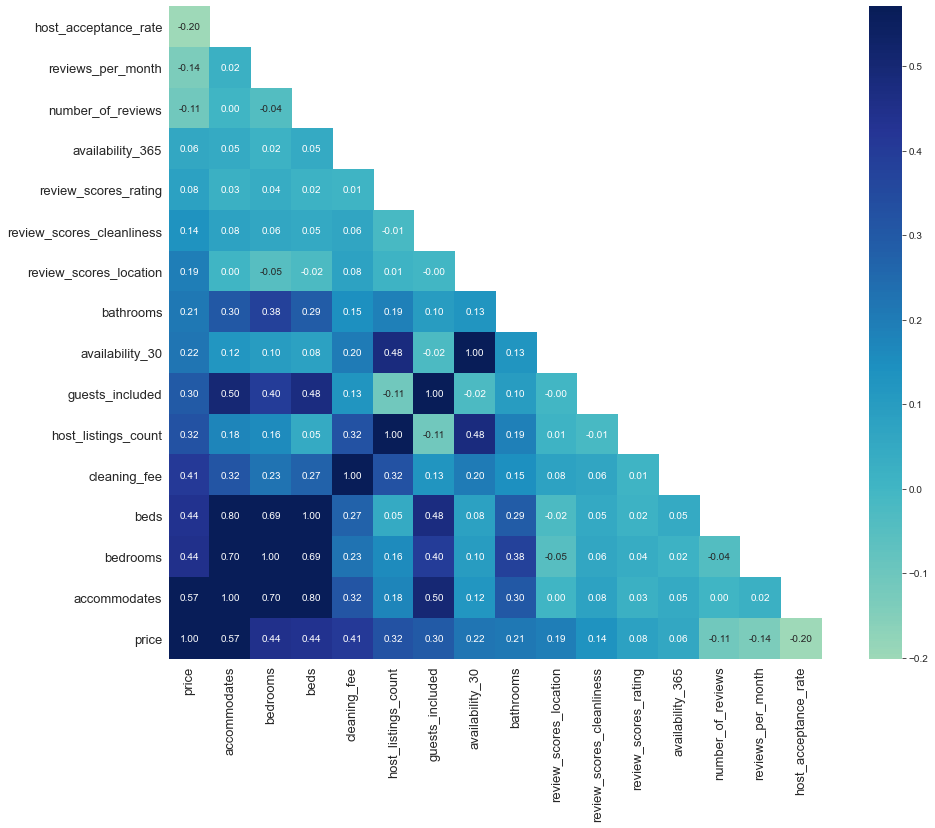

In [25]:
# heatmap
num_corr = num_cols_new.corr().sort_values('price', axis=1, ascending=False)
num_corr = num_corr.sort_values('price', axis=0, ascending=True)
mask = np.zeros_like(num_corr)
mask[np.triu_indices_from(mask, k=1)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(17, 12))
    ax = sns.heatmap(num_corr, mask=mask, vmin=corr.price.min(), 
                     vmax=corr.drop(['price'], axis=0).price.max(), center=0, square=True, 
                     annot=True, fmt='.2f',cmap='YlGnBu',annot_kws={"size": 10})

# increase tick label size
ax.tick_params(labelsize=13)

<a id='3.2'></a>
### 3.2. Categorial variable selection

Based on our heatmap plot for [categorical variables](#2.10), the variables with the highest correlation will be removed. The top 20 categorcial variables based on what we think are important variables and their correlation to price will selected for our price prediction.

In [26]:
print ('\033[1m' + 'Our selected categorical variables:' + '\033[0m')
col_list(cat_cols_index)

Our selected categorical variables:
neighbourhood_cleansed
property_type
room_type
bed_type
cancellation_policy
host_is_superhost
instant_bookable
is_location_exact
require_guest_phone_verification
require_guest_profile_picture


#### Create dummy variables

To increase our model accuracy, we need to create dummy variables for each of the answers of our selected variables. The way we do this is to create labels of 0, 1 encodings. The response will be reflected on the price prediction and no category will be take priority over another. Our first step is to extract the categorical variables to use for our dummy variables, we will create a new column for each level of a category. For example, if a row indicates a property is a house and but not an apartment then it would encode 1 to a 'house' column and 0 to the 'apartment' column and vice-versa.

In [27]:
# getting categorical columns 
cat_cols = listings_new[cat_cols_index]

# creating dummy variables
for col in cat_cols_index:
    cat_cols = pd.concat([cat_cols.drop(col, axis=1), pd.get_dummies(cat_cols[col], prefix=col, prefix_sep='_', 
                                                                     drop_first=True)], axis=1)
cat_cols = pd.concat([listings_new['price'], cat_cols], axis=1)
print ('\033[1m' + 'cat_cols:' + '\033[0m')
col_list(cat_cols.columns)
cat_cols.shape

cat_cols:
price
neighbourhood_cleansed_Back Bay
neighbourhood_cleansed_Bay Village
neighbourhood_cleansed_Beacon Hill
neighbourhood_cleansed_Brighton
neighbourhood_cleansed_Charlestown
neighbourhood_cleansed_Chinatown
neighbourhood_cleansed_Dorchester
neighbourhood_cleansed_Downtown
neighbourhood_cleansed_East Boston
neighbourhood_cleansed_Fenway
neighbourhood_cleansed_Hyde Park
neighbourhood_cleansed_Jamaica Plain
neighbourhood_cleansed_Leather District
neighbourhood_cleansed_Longwood Medical Area
neighbourhood_cleansed_Mattapan
neighbourhood_cleansed_Mission Hill
neighbourhood_cleansed_North End
neighbourhood_cleansed_Roslindale
neighbourhood_cleansed_Roxbury
neighbourhood_cleansed_South Boston
neighbourhood_cleansed_South Boston Waterfront
neighbourhood_cleansed_South End
neighbourhood_cleansed_West End
neighbourhood_cleansed_West Roxbury
property_type_Bed & Breakfast
property_type_Boat
property_type_Camper/RV
property_type_Condominium
property_type_Dorm
property_type_Entire Floor
p

(3491, 51)

#### Select the top 20 categorical variables

In [28]:
# select top 20 categorical variables
response = 'price'
no_cat_variables = 20

# creating variable using select_var function then concat df
cat_cols_selected = select_var(cat_cols, response, no_cat_variables, response)
cat_cols_new = pd.concat([cat_cols['price'], cat_cols_selected], axis=1)

print ('\033[1m' + 'Top 20 correlated categorical variables:' + '\033[0m')
col_list(cat_cols_selected.columns)

Top 20 correlated categorical variables:
room_type_Private room
cancellation_policy_super_strict_30
require_guest_phone_verification_t
neighbourhood_cleansed_Back Bay
neighbourhood_cleansed_Dorchester
property_type_House
neighbourhood_cleansed_Downtown
bed_type_Real Bed
room_type_Shared room
cancellation_policy_strict
neighbourhood_cleansed_Brighton
neighbourhood_cleansed_South Boston Waterfront
neighbourhood_cleansed_Chinatown
neighbourhood_cleansed_Jamaica Plain
is_location_exact_t
neighbourhood_cleansed_Fenway
bed_type_Futon
neighbourhood_cleansed_South End
neighbourhood_cleansed_East Boston
neighbourhood_cleansed_Mission Hill


#### Heatmap for categorical variables

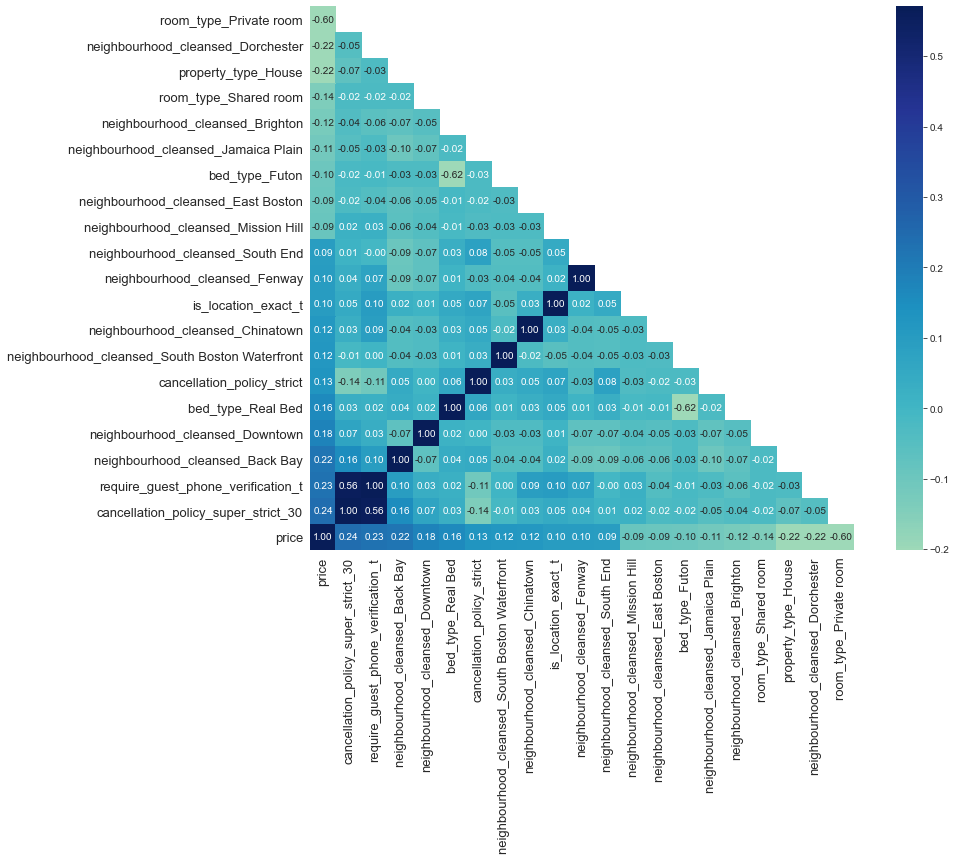

In [29]:
# heatmap
cat_corr = cat_cols_new.corr().sort_values('price', axis=1, ascending=False)
cat_corr = cat_corr.sort_values('price', axis=0, ascending=True)
mask = np.zeros_like(cat_corr)
mask[np.triu_indices_from(mask, k=1)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 10))
    ax = sns.heatmap(cat_corr, mask=mask, vmin=corr.price.min(), 
                     vmax=corr.drop(['price'], axis=0).price.max(), center=0, square=True, 
                     annot=True, fmt='.2f',cmap='YlGnBu',annot_kws={"size": 10})

# increase tick label size
ax.tick_params(labelsize=13)

<a id='3.3'></a>
### 3.3. Prepare data for Machine Learning

In [30]:
# appending our selected variables
x = pd.concat([cat_cols_selected, num_cols_selected], axis=1)

# response variable
y = num_cols.price

# split sizes
test_size = 0.3
random_state = 42

# split data into train and test set
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = test_size, random_state = random_state)

As we discussed earlier, it is important to select variables with high correlation in order to build a model with better accuracy. We need to also remember to select the correct number of variables as too many can cause overfitting and too few can cause an inaccurate model.

Based on our heatmap plot for [numerical variables](#2.9), the variables with the highest correlation will be removed. The top 15 numerical variables based on their correlation price will selected for our price prediction. Our heatmap plot for [categorical variables](#2.10), shows the top 20 categorcial variables based on what we think are important variables. Their correlation to price will selected for our price prediction.

<a id='model_data'></a>
## 4. Model Data

<a id='4.1'></a>
### 4.1. Price Prediction
It is possible to use just raw text as input for making predictions but the most important factor is being able to extract relevant features from the data. I would say it should be used as a complimentary source of data in order to extract more machine learning features to increase the predictive power of a current model.

In [31]:
# using Linear regression
lm_model = LinearRegression()
lm_model.fit(x_train, y_train)
y_test_preds = lm_model.predict(x_test)
y_train_preds = lm_model.predict(x_train)

# r2 values
r2_scores_test = r2_score(y_test, y_test_preds)
r2_scores_train = r2_score(y_train, y_train_preds)

# print results
print('r2_scores_test:', r2_scores_test)
print('r2_scores_train:', r2_scores_train)

r2_scores_test: 0.6503174329817782
r2_scores_train: 0.6360199044970594


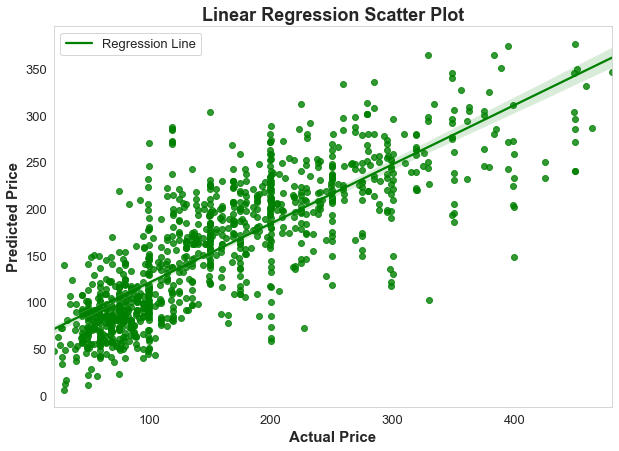

In [32]:
# plot init
fig = plt.figure(figsize =(10, 7))
ax = sns.regplot(data=x, x=y_test, y=y_test_preds, marker='o', color='g')

# plot design
title = 'Linear Regression Scatter Plot'; xlabel = 'Actual Price'; ylabel = 'Predicted Price'
plt.title(title, weight='bold', fontsize=18)
ax.set_xlabel(xlabel, weight='bold', fontsize=15)
ax.set_ylabel(ylabel, weight='bold', fontsize=15)
plt.legend(['Regression Line'], prop={"size":13})
plt.tick_params(labelsize=13)
ax.grid(False)
plt.show()

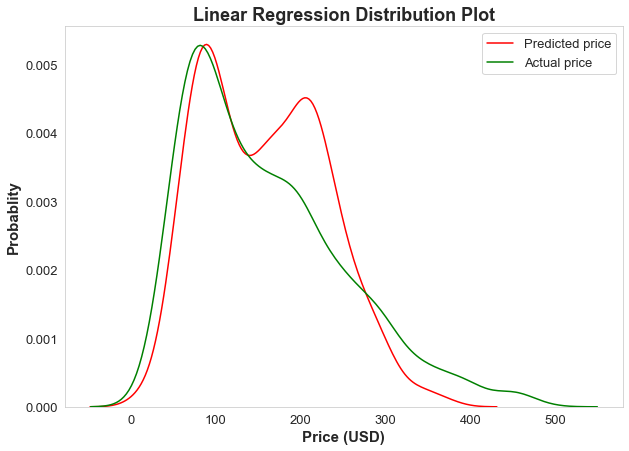

In [33]:
# plot init
fig = plt.figure(figsize =(10, 7))
ax = sns.kdeplot(data=y_test_preds, color='r'); sns.kdeplot(data=y_test, color='g')

# plot design
title = 'Linear Regression Distribution Plot'; xlabel = 'Price (USD)'; ylabel = 'Probablity'
plt.title(title, weight='bold', fontsize=18)
ax.set_xlabel(xlabel, weight='bold', fontsize=15)
ax.set_ylabel(ylabel, weight='bold', fontsize=15)
plt.legend(['Predicted price', 'Actual price'], prop={"size":13})
plt.tick_params(labelsize=13)
ax.grid(False)
plt.show()

<a id='4.2'></a>
### 4.2. Review Prediction

**Prepare categorical and missing data:** The next step is to clean the data visually and programmatically.

#### Removing columns

In [34]:
# comparing column differences for listing datasets in both cities
common_cols = bos_list.columns.intersection(sea_list.columns)
col_diff = bos_list.columns.difference(sea_list.columns)
col_diff

Index(['access', 'house_rules', 'interaction'], dtype='object')

In [35]:
# dropping columns that we won't need later
drop_col=['listing_url','scrape_id','jurisdiction_names','license','thumbnail_url','medium_url','picture_url','xl_picture_url'
        ,'host_thumbnail_url','host_picture_url','neighbourhood_group_cleansed']
bos_list.drop(drop_col, axis=1, inplace=True)
sea_list.drop(drop_col, axis=1, inplace=True)

#### Quality Issues:

<blockquote><b>Common data quality issues include:</b>

- Missing data, like a missing value.
- Invalid data, like a cell having an impossible value, e.g., like negative height value. 
- Having "inches" and "centimetres" in the height entries is technically invalid as well, since the datatype for height becomes a string when those are present. The datatype for height should be integer or float.
- Inaccurate data, like a person actually being 58 inches tall, not 55 inches tall.
- Inconsistent data, like using different units for height (inches and centimetres).</blockquote>

Incorrect data types:

- `bos_cal` and `sea_cal` have boolians as **t** for 'true' and **f** for 'false'
- `bos_cal` and `sea_cal` have price as strings
- `bos_list` and `sea_list` have price as strings

Missing data:

- `bos_cal` column `price` has 665853 missing rows
- `sea_cal` column `price` has 459028 missing rows
- `bos_rev` column `comments` has 53 missing rows
- `sea_rev` column `comments` has 18 missing rows
- `sea_list` has 3 missing columns `access`, `house_rules`, `interaction` compared to `list_bos`
- match listing id's from `bos_rev` and `bos_cal`

#### Tidiness Issues:

<blockquote><b>A dataset is messy or tidy depending on how rows, columns, and tables are matched up with observations, variables, and types. In tidy data:</b>

- Each variable forms a column.
- Each observation forms a row.
- Each type of observational unit forms a table.</blockquote>

- None

### Issue 1

#### Define

- `bos_cal` and `sea_cal` have boolians as **t** for 'true' and **f** for 'false'

#### Code

In [36]:
# convert string to boolian
bos_cal['available'] = bos_cal['available'] == 't'
sea_cal['available'] = bos_cal['available'] == 't'

#### Test

In [37]:
bos_cal.head()

,listing_id,date,available,price
0,12147973,2017-09-05,False,NaN
1,12147973,2017-09-04,False,NaN
2,12147973,2017-09-03,False,NaN
3,12147973,2017-09-02,False,NaN
4,12147973,2017-09-01,False,NaN


In [38]:
# checking datatype
bos_cal[['available']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1308890 entries, 0 to 1308889
Data columns (total 1 columns):
 #   Column     Non-Null Count    Dtype
---  ------     --------------    -----
 0   available  1308890 non-null  bool 
dtypes: bool(1)
memory usage: 1.2 MB


### Issue 2

#### Define

- `bos_cal` and `sea_cal` have price as strings

#### Code

In [39]:
# function to remove strings from integers
def remove_int_strings(df, col):
    '''
    INPUT:
    df - pandas dataframe, holding all the variables interested
    col - columns in dataframe to remove strings from, str
    

    OUTPUT:
    none
    '''
    # remove strings from rows in column
    df[col] = df[col] = df[col].str.replace('$', '', regex=True).str.replace(',', '', regex=True).str.replace(' ', '', regex=True)
    
    # convert to float
    df[col] = df[col].astype(float)

In [40]:
# remove strings from bos_cal and convert to float
remove_int_strings(bos_cal, 'price')

# remove strings from sea_cal and convert to float
remove_int_strings(sea_cal, 'price')

#### Test

In [41]:
# sampling 10 random results
bos_cal['price'][bos_cal['price'].notna()].sample(3)

1063033     62.0
1057538    135.0
1214187    350.0
Name: price, dtype: float64

In [42]:
bos_cal['price'].describe()

count    643037.000000
mean        198.438909
std         180.142913
min          11.000000
25%          85.000000
50%         150.000000
75%         255.000000
max        7163.000000
Name: price, dtype: float64

In [43]:
# sampling 10 random results
sea_cal['price'][sea_cal['price'].notna()].sample(3)

436402     100.0
1386515     77.0
478954     700.0
Name: price, dtype: float64

In [44]:
sea_cal['price'].describe()

count    934542.000000
mean        137.944859
std         105.062870
min          10.000000
25%          75.000000
50%         109.000000
75%         160.000000
max        1650.000000
Name: price, dtype: float64

### Issue 3

#### Define

- `bos_list` and `sea_list` have price as strings

#### Code

In [45]:
# remove strings from bos_cal and convert to float
remove_int_strings(bos_list, 'price')

# remove strings from sea_cal and convert to float
remove_int_strings(sea_list, 'price')

#### Test

In [46]:
# sampling 10 random results
bos_list['price'][bos_list['price'].notna()].sample(3)

307      72.0
3015     55.0
3068    214.0
Name: price, dtype: float64

In [47]:
bos_list['price'].describe()

count    3585.000000
mean      173.925802
std       148.331321
min        10.000000
25%        85.000000
50%       150.000000
75%       220.000000
max      4000.000000
Name: price, dtype: float64

In [48]:
# sampling 10 random results
sea_list['price'][sea_list['price'].notna()].sample(3)

3755    240.0
3561    399.0
2879    119.0
Name: price, dtype: float64

In [49]:
sea_list['price'].describe()

count    3818.000000
mean      127.976166
std        90.250022
min        20.000000
25%        75.000000
50%       100.000000
75%       150.000000
max      1000.000000
Name: price, dtype: float64

- `bos_cal` column `price` has 665853 missing rows
- `sea_cal` column `price` has 459028 missing rows

In [50]:
# % of missing data
bos_cal.notna().mean()

listing_id    1.000000
date          1.000000
available     1.000000
price         0.491284
dtype: float64

In [51]:
# % of missing data
sea_cal.notna().mean()

listing_id    1.000000
date          1.000000
available     0.939235
price         0.670610
dtype: float64

#### Define

- `sea_list` has 3 missing columns `access`, `house_rules`, `interaction` compared to `list_bos`

#### Code

In [52]:
bos_list = bos_list.drop(col_diff, axis=1)

#### Test

In [53]:
bos_list.columns.equals(sea_list.columns)

True

### Issue 4

#### Define

- `bos_rev` column `comments` has 53 missing rows

#### Code

In [54]:
# nan counts
bos_rev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68275 entries, 0 to 68274
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   listing_id     68275 non-null  int64 
 1   id             68275 non-null  int64 
 2   date           68275 non-null  object
 3   reviewer_id    68275 non-null  int64 
 4   reviewer_name  68275 non-null  object
 5   comments       68222 non-null  object
dtypes: int64(3), object(3)
memory usage: 3.1+ MB


In [55]:
# drop all missing comments and other data
bos_rev.dropna(inplace=True)

#### Test

In [56]:
bos_rev.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68222 entries, 0 to 68274
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   listing_id     68222 non-null  int64 
 1   id             68222 non-null  int64 
 2   date           68222 non-null  object
 3   reviewer_id    68222 non-null  int64 
 4   reviewer_name  68222 non-null  object
 5   comments       68222 non-null  object
dtypes: int64(3), object(3)
memory usage: 3.6+ MB


### Issue 5

#### Define

- match listing id's from `bos_rev` and `bos_list`

#### Code

In [57]:
print('Boston Review ID Shape:', bos_rev['listing_id'].shape[0], '\n'
      'Boston Listing ID Shape:', (bos_list['id']).shape[0])

Boston Review ID Shape: 68222 
Boston Listing ID Shape: 3585


In [58]:
# creating dataframe with matching listing id's to ensure loops don't crash looking for id mismatches
bos_rev_match = bos_rev[bos_rev['listing_id'].isin(bos_list['id'])].copy()

#### Test

In [59]:
# new df saved as bos_rev_match
print('Boston Review ID Shape:', bos_rev_match['listing_id'].shape[0], '\n'
      'Boston Listing ID Shape:', (bos_list['id']).shape[0])

Boston Review ID Shape: 68222 
Boston Listing ID Shape: 3585


### Issue 6

#### Define

- match listing id's from `bos_cal` and `bos_list`

#### Code

In [60]:
print('Boston Calendar ID Shape:', bos_cal['listing_id'].shape[0], '\n'
      'Boston Listing ID Shape:', (bos_list['id']).shape[0])

Boston Calendar ID Shape: 1308890 
Boston Listing ID Shape: 3585


In [61]:
# creating dataframe with matching listing id's to ensure loops don't crash looking for id mismatches
bos_cal_match = bos_cal[bos_cal['listing_id'].isin(bos_list['id'])]

#### Test

In [62]:
print('Boston Calendar ID Shape:', bos_cal_match['listing_id'].shape[0], '\n'
      'Boston Listing ID Shape:', (bos_list['id']).shape[0])

Boston Calendar ID Shape: 1308890 
Boston Listing ID Shape: 3585


<b>Method references:</b><br>
https://www.kaggle.com/dansbecker/handling-missing-values<br>
https://pandas.pydata.org/pandas-docs/stable/user_guide/missing_data.html

Sentiment analysis is part of something called Natural Language Processing or 'NLP'. These are a group of techniques used to extract emotions from raw text. This is usually common on things like social media posts or product review pages in order to automatically understand if some users left a positive or negative review and why. Our goal is to use sentiment analysis to find out if our Airbnb reviews are positive or negative based on raw text. Below are a list of the libraries we will use:

- **Scikit-learn:** the most popular Python Machine Learning library
- **NLTK:** the most popular Python module for NLP techniques
- **Gensim:** a topic-modelling and vector space modelling toolkit

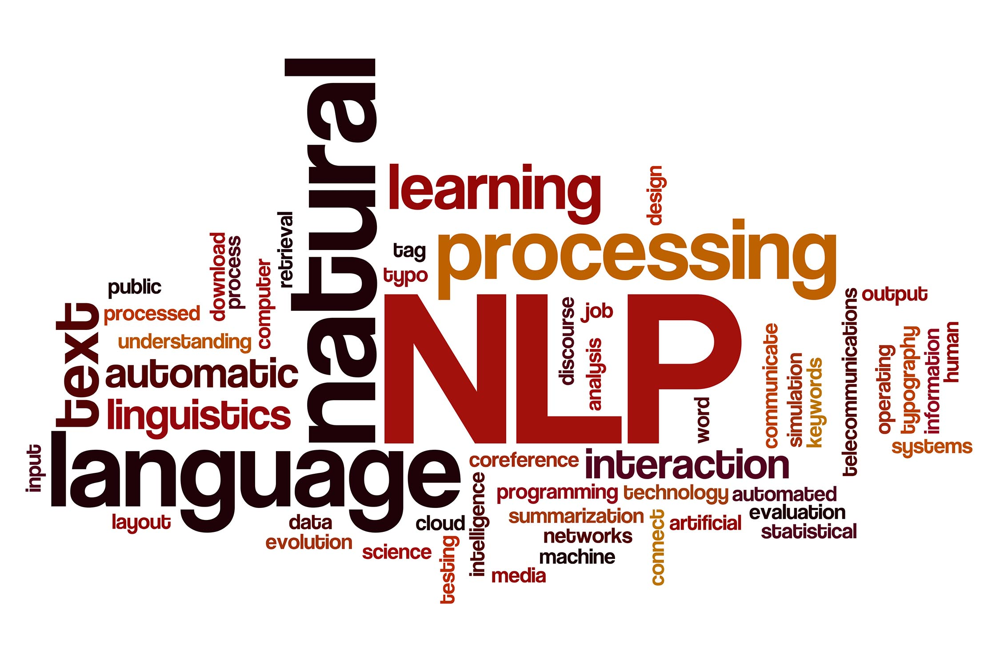

We will use here some Boston Airbnb reviews in the 'Boston reviews' dataset, `bos_rev` as data. Each observation consists in a single customer review for a single property. Each customer review is composed of a textual feedback of the customer’s experience at the property and an average rating for each property in the 'Boston Listings' dataset, `bos_list`. A sample of the data is presented below:

In [63]:
# sampling the boston reviews
bos_rev.sample(5)

,listing_id,id,date,reviewer_id,reviewer_name,comments
2070,1497879,40118635,2015-07-28,36384332,Bronz,Great Studio near the airport. Great views of ...
61902,1815326,14900077,2014-06-29,10893569,Jacquie,"Phyllis is a superb hostess... super friendly,..."
48517,2933661,40044838,2015-07-27,6243772,Scott,The nicest people - very relaxed and helpful. ...
67510,11758169,87952742,2016-07-22,17313937,Joanne,"Julie's home is clean, cozy, and exactly as pi..."
22152,2881388,92849549,2016-08-10,15465745,Vanessa,Jason est disponible et conciliant. L appartem...


For each review, we want to predict if it corresponds to a positive review with a happy experience or a negative review with an unhappy experience. Since each invidual review does not have a rating we will have to use the average overall rating from `bos_list` as a reference. 

In [64]:
print('Minimum Review Score:', bos_list['review_scores_rating'].min(),'\n'
      'Maximum Review Score:', bos_list['review_scores_rating'].max())

Minimum Review Score: 20.0 
Maximum Review Score: 100.0


As we can see the reviews overall can range between 20/100 to 100/100. In order to simplify our methodology we can split those scores into two categories:

- Good reviews will be identified by ratings of > 50
- Bad reviews will be identified by ratings of < 50

Our objective is to predict if each review is positive or negative based on just the raw text. We can use the average overall review score for each listing to compare our results. Since we have no score data for each individual review, we need to take the average review score and apply it to each `listing_id`. Next we need to create a dummy column using an if < 5 else 0 statement to label each review 1 'bad' or 0 'good'.  

We can create a function to use list comprehension to iterate through rows to compare ids and extract the relevant columns from one dataframe to another dataframe we assign the data to. First, we need to make sure both datframes contain the same ids using `.isin` so we can filter and create a new variable. If we don't, the function we create later will crash due to id mismatches. So, let's reference the id's of Boston Reviews to match the Boston Listings id's and save the variable as `bos_rev_match`. The code has been allocated to the [Clean](#clean) section of this notebook.

Now, it's time to create a function we can use again later for other things. We will be sure to use `len()` to prevent out of bounds errors too.

In [65]:
# function to copy data between dataframes
def append_df(df_org, df_dest, col, file_name): 
    """
    Readme: For each id copy and append selected data from row to another df column then save to csv. 
    
    *args descriptions:
    
    df_org = origin df where data is gathered from as soon as the id is matched
    df_dest = destination df where selected data from df_org is appended to a new column 'col'
    col = name for the selected column for the data being copied over as a string in quotes
    file_name = csv output file name as a string in quotes
    """

    # silence the SettingWithCopyWarning
    pd.options.mode.chained_assignment = None  # default='warn'

    # count each row
    counter = -1
    
    # creating an empty list for column data
    row_list = []

    for i in range(len(df_dest)):
        
        # add +1 for each row looped
        counter +=1
        
        # result is the value extracted from each row of the target column
        result = df_org[col][df_org['id'] == df_dest['listing_id'].iloc[i]].iloc[0]
        
        # display the listing_id for each operation
        id_count = df_org['id'][df_org['id'] == df_dest['listing_id'].iloc[i]].iloc[0]
        
        # display the listing_id for each operation
        row_list.append(result)
        
        # append the result values to the empty list variable
        progress = round(np.multiply(np.divide(counter, len(df_dest)), 100), 2)
        
         # create a % progress counter
        print(counter, id_count, result, progress, '%')

    # write list to new column and save df to csv
    df_dest[col] = row_list
    df_dest.to_csv(file_name, index=False)

In [66]:
# assign saved csv to variable if we skip the function after running it once to save time running the whole notebook
bos_rev_updated = pd.read_csv('boston_review_updated.csv')

# create a new dummy column for review classification
bos_rev_updated.rename(columns={'review_scores_rating':'review_score_avg'}, inplace = True)
bos_rev_updated['is_bad_review'] = bos_rev_updated['review_score_avg'].apply(lambda x: 1 if x < 50 else 0)
bos_rev_updated.head(1)

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_score_avg,is_bad_review
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam's place was really cool! Good...,86.0,0


#### Installing the libraries we need:

In [67]:
# The pprint module provides a capability to “pretty-print” arbitrary Python data structures
from pprint import pprint

#### Translating Non-English comments to English:

Some text in `comments` are written in languages other than English so we need to convert them to English first. Here is a useful resource for this: https://medium.com/analytics-vidhya/translate-list-and-pandas-data-frame-using-googletrans-library-in-python-f28b8cb84f21

How to handle error exceptions like 401 error: too many requests: https://stackoverflow.com/questions/49942698/exception-handling-when-applying-function-to-pandas-df

We may have to give up on this part due to the API limitations placed by Google Translator on both libraries. There are 401 HTTP request errors which means we are probably limited by the amout of queries we can make until it temporarily blocks our IP.

#### Cleaning our text

That looks much better! Our next step is to clean the raw text data to speed up our operations on it. We can start by creating a function to clean our raw text data. To do this we need a strategy to perform various transformations such as:

- Lowering the text case
- Removing stop words like 'the', 'this', 'is', 'a' etc
- Remove words that contain numbers
- Lemmatize text. This means transforming each word into their root form, for example: jumped > jump, driving > drive
- Part-Of-Speech (POS) tagging. This consists of assigning tags to each word to define it as a noun or verb etc by using the WordNet lexical database

In [68]:
# assign saved csv to variable if we skip the function after running it once to save time running the whole notebook
bos_rev_updated = pd.read_csv('boston_review_updated_wordnet.csv')
bos_rev_updated.head(3)

,listing_id,id,date,reviewer_id,reviewer_name,comments,review_score_avg,is_bad_review,comments_clean
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam's place was really cool! Good...,86.0,0,stay islam's place really cool good location a...
1,1178162,4869189,2013-05-29,6452964,Charlotte,Great location for both airport and city - gre...,86.0,0,great location airport city great amenity hous...
2,1178162,5003196,2013-06-06,6449554,Sebastian,We really enjoyed our stay at Islams house. Fr...,86.0,0,really enjoy stay islam house outside house lo...


#### Feature Engineering

Feature engineering is the process of using domain knowledge to extract features from raw data. These features can be used to improve the performance of machine learning algorithms. Feature engineering can be considered as applied machine learning itself. We can use feature engineering to add sentiment analysis features since we can guess that customers reviews correlate with how they felt about their experience in their Airbnb property. We will use Vader to find which words are positive or negative. Vader is a part of the NLTK module designed for sentiment analysis. For each comment, Vader will return 4 scores we will integrate into our dataset:

- neutrality score
- position score
- negativity score
- an overall score based on a summary of all the previous scores

In [69]:
# adding sentiment anaylsis columns
from nltk.sentiment.vader import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()
bos_rev_updated["sentiments"] = bos_rev_updated['comments'].apply(lambda x: sia.polarity_scores(x))
bos_rev_updated = pd.concat([bos_rev_updated.drop(['sentiments'], axis=1), bos_rev_updated['sentiments'].apply(pd.Series)], axis=1)

Next, we can add some basic metrics for each comment:
- number of characters in the text
- number of words in the text

In [70]:
# add number of characters column
bos_rev_updated['num_chars'] = bos_rev_updated['comments'].apply(lambda x: len(x))

# add number of words column
bos_rev_updated['num_words'] = bos_rev_updated['comments'].apply(lambda x: len(x.split(" ")))

# rearrange columns
mid = bos_rev_updated['comments_clean']
bos_rev_updated.drop(labels=['comments_clean'], axis=1, inplace = True)
bos_rev_updated.insert(6, 'comments_clean', mid)
bos_rev_updated.head(1)

,listing_id,id,date,reviewer_id,reviewer_name,comments,comments_clean,review_score_avg,is_bad_review,neg,neu,pos,compound,num_chars,num_words
0,1178162,4724140,2013-05-21,4298113,Olivier,My stay at islam's place was really cool! Good...,stay islam's place really cool good location a...,86.0,0,0.0,0.648,0.352,0.9626,262,49


Next, we must extract the vector representations for each review. The Gensim module 'Word2Vec' creates a numerical vector for every word in the language database by using the contexts in which they appear using shallow neural networks. Interestingly, similar words will have similar representation vectors which is useful.

Text can also be transformed into numerical vectors using the word vectors in the Gensim module 'Doc2Vec'. Identical texts will also have similar representations just like 'Word2Vec' so we can use those vectors as our training features. First, we need to train our Doc2Vec model by using our text data. Applying the model on our reviews will give us the representation vectors we are looking for. 

In [71]:
# checking the operation worked
bos_rev_updated.isna().sum()

listing_id           0
id                   0
date                 0
reviewer_id          0
reviewer_name        0
comments             0
comments_clean      81
review_score_avg    65
is_bad_review        0
neg                  0
neu                  0
pos                  0
compound             0
num_chars            0
num_words            0
dtype: int64

In [72]:
# removing any new null rows
bos_rev_updated = bos_rev_updated.dropna()

In [73]:
# # assign csv to variable
bos_rev_updated = pd.read_csv('boston_review_updated_gensim.csv')

Our last step is to add the TF-IDF values for every word and document. IF-IDF stands for 'Term Frequency - Inverse Document Frequency'.

We could simply count the amount of times each word appears in every document but that won't take into account the relative importance of the words in context. A word that is used in almost every text most likely not yield useful information for our analysis. A better approach would be to look for rare words which may have more important meanings. TF-IDF does this by multiplying two metrics: how many times a word appears in a document, and the inverse document frequency of the word across a set of documents. Great! So, how do we solve our problem?

TF-IDF solves this problem by using a metric system by:
- using TF to compute the number of times a word appears in the text
- using IDF to compute the relative importane of this word depending on the amount of texts the word can be found in

We will add TF-IDF columns for every word which appears in at minimum 10 different texts to filter a few and reduce the output size.

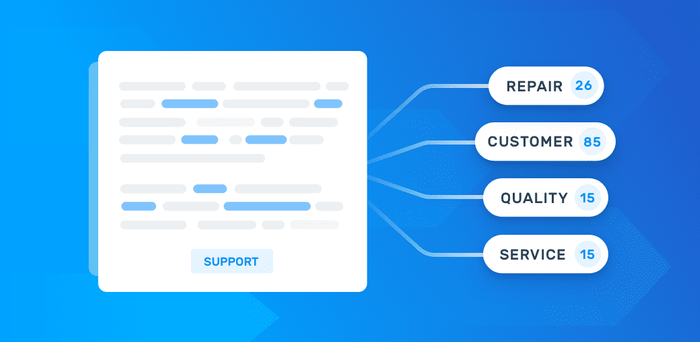

In [74]:
# add tf-idfs columns
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(min_df = 10)
tfidf_result = tfidf.fit_transform(bos_rev_updated['comments_clean']).toarray()
tfidf_df = pd.DataFrame(tfidf_result, columns = tfidf.get_feature_names())
tfidf_df.columns = ["word_" + str(x) for x in tfidf_df.columns]
tfidf_df.index = bos_rev_updated.index
bos_rev_updated = pd.concat([bos_rev_updated, tfidf_df], axis=1)

#### Sentiment EDA

In [75]:
# is_bad_review distribution
bos_rev_updated["is_bad_review"].value_counts(normalize = True) * 100

0    99.939773
1     0.060227
Name: is_bad_review, dtype: float64

Our dataset is very lopsided since only 0.06% of our reviews are considered 'bad' reviews, however it should be useful when we create our ML model. Next, we can use a wordcloud to understand the words used most in the reviews.

#### Wordcloud

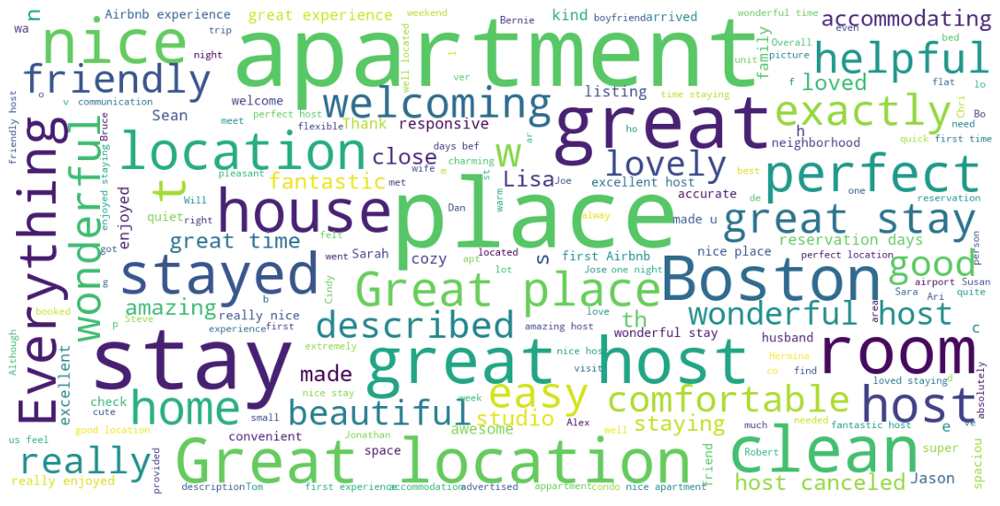

In [76]:
# wordcloud function

from wordcloud import WordCloud

def print_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()
    
# print wordcloud
print_wordcloud(bos_rev_updated['comments'])

Most words we see above are indeed related to apartments but also location and customer service. We can see words like `house`, `great location`, `great host`, `quiet`, `clean`, `spacious`, etc. Some words are more related to negative experience with the hotel stay such as `host canceled`, `small`, etc.

#### Top 10 positive & negative sentiments

In [77]:
# top 10 rated positive sentiment reviews (with more than 5 words)
bos_rev_updated[bos_rev_updated['num_words'] >= 5].sort_values("pos", ascending = False)[['comments', 'pos']].head(10)

,comments,pos
33553,Super clean. Nice bed. Great value!,0.942
6559,"Perfectly located, clean, good value.",0.924
64925,"Nice, clean and Comfortable",0.898
31879,"nice, adorable and clean",0.897
15174,Great appartment & great welcome! Thanks John ;),0.891
39781,Great! Great! Awesome stay. Thank you!!,0.889
34558,"Great room, Great location, Great energy!",0.880
65044,"Great Experience - beautiful clean, excellent ...",0.878
3703,Awesome host great friend thanks Ari,0.877
36900,"Great, responsive host. Perfect unit. Strongly...",0.877


The top 10 most positive reviews correlate to good feedback comments.

In [78]:
# top 10 rated negative sentiment reviews (with more than 5 words)
bos_rev_updated[bos_rev_updated['num_words'] >= 5].sort_values("neg", ascending = False)[['comments', 'neg']].head(10)

,comments,neg
13178,"Die Beschreibung von Lage, Anfahrtsmöglichkeit...",0.565
25149,No problems. Nice place.,0.563
55623,Good place. No complaints.,0.557
41411,Die Wohnung war wie beschrieben. \r\nDie Anbin...,0.543
59427,die Wohnung war wie abgebildet.wir haben uns w...,0.539
33707,Host's attitude is so bad.,0.529
24163,Die Beschreibung der Unterkunft war gut und es...,0.494
23117,The location is very bad,0.487
50222,Terrible room. It's a futon bed with no sheets.,0.469
35981,"everything was perfect, no problem.",0.462


The top 10 most negative reviews correlate to only some bad feedback comments. We can see that some sentiments are incorrect as they have positive sentiments, this could be due to the fact we used an average review score for each listing. Vader sometimes can interpret the words 'no' or ' complaints' as negative words when they can infact be used to say there were no problems or complaints with the propery. Also, there may also be foreign languages used in some of the comments, we can try to fix that if we need to. Unhappy customers complained about the host, location, or the room itself.

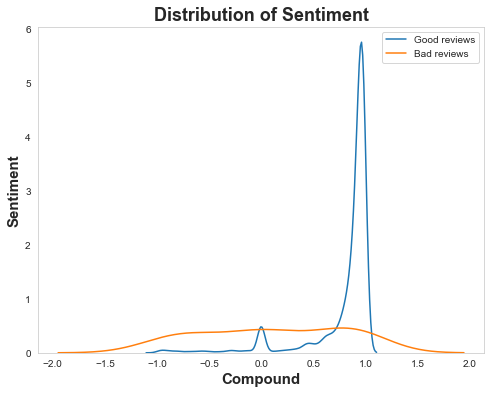

In [79]:
# plot sentiment distribution for positive and negative reviews
sns.set_style("whitegrid", {'axes.grid' : False})
plt.figure(figsize=(8,6))

for x in [0, 1]:
    subset = bos_rev_updated[bos_rev_updated['is_bad_review'] == x]
    
    # draw the density plot
    if x == 0:
        label = 'Good reviews'
    else:
        label = 'Bad reviews'
    p = sns.kdeplot(subset['compound'], label = label)

# plot design
p.set_title('Distribution of Sentiment', weight='bold', fontsize=18)
p.set_xlabel('Compound', weight='bold', fontsize=15)
p.set_ylabel('Sentiment', weight='bold', fontsize=15)
plt.legend()
plt.show()

The graph we plotted above shows the distribution of the review sentiments across both good and bad reviews. We can observe good reviews are generally consisdered with high sentiment by Vader and bad reviews generally have a low compound sentiment score. These features will be very important in helping us create our model.

First, we must choose which features to use to train our model. We can split our data into two parts afterwards:
- Training: to train our model
- Testing: to assess how our model performs

In [80]:
#  selected features
label = 'is_bad_review'
ignore_cols = [label, 'comments', 'comments_clean', 'listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name']
features = [c for c in bos_rev_updated.columns if c not in ignore_cols]

# splitting the data into train and test
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(bos_rev_updated[features], bos_rev_updated[label], test_size = 0.30, random_state = 42)

Let's move on to the next part of our modelling. We will use a Random Forest (RF) classifier for predictions.

In [81]:
# training our random forest classifier
rf = RandomForestClassifier(n_estimators = 100, random_state = 42)
rf.fit(X_train, y_train)

# creating a df showing each feature importance
feature_imp = pd.DataFrame({"feature": features, "importance": rf.feature_importances_}).sort_values("importance", ascending = False)
feature_imp.head(20)

,feature,importance
0,review_score_avg,0.194940
10,doc2vec_vector_3,0.027841
7,doc2vec_vector_0,0.024069
11,doc2vec_vector_4,0.022965
8,doc2vec_vector_1,0.022830
9,doc2vec_vector_2,0.021296
1,neg,0.013272
5,num_chars,0.011689
3,pos,0.010844
4,compound,0.010749


The most important features are the review_score_avg followed by doc2vec and, compound. But `neg` and `pos` are near the middle. The features at the bottom are words that have good importance.

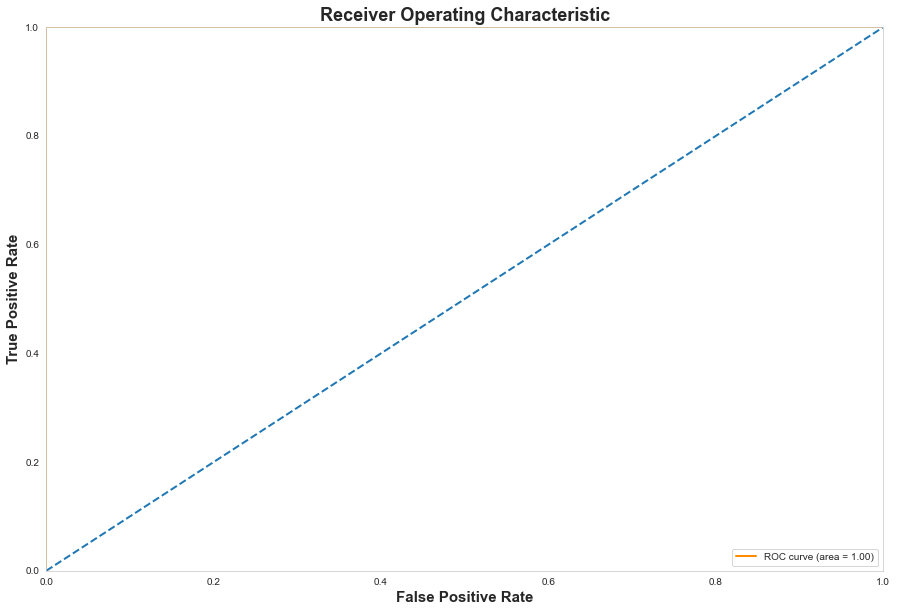

In [82]:
# ROC curve
from sklearn.metrics import roc_curve, auc, roc_auc_score

y_pred = [x[1] for x in rf.predict_proba(X_test)]
fpr, tpr, thresholds = roc_curve(y_test, y_pred, pos_label = 1)

roc_auc = auc(fpr, tpr)

plt.figure(1, figsize = (15, 10))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])

# plot design
plt.title('Receiver Operating Characteristic', weight='bold', fontsize=18)
plt.xlabel('False Positive Rate', weight='bold', fontsize=15)
plt.ylabel('True Positive Rate', weight='bold', fontsize=15)
plt.legend(loc="lower right")
plt.show()

ROC (Receiver Operating Characteristic) curve is good way to summarize the quality of our classifier. The higher the curve is above the diagonal baseline, the better the predictions. Although the AUC ROC (Area Under the Curve) is very good, we should not use it here, the ROC curve is the best way to assess the quality of our model.

**Why ROC?** 
First let us remind the False Positive Rate formula, which corresponds to the x axis of the ROC curve: FPR (False Positive Rate) = `False Positives` / `Negatives`.

Here the `Negatives` corresponds to our number of good reviews which is very high because our dataset is imbalanced. This means that even with some False Positives, our FPR will tend to stay very low. Our model will be able to make a lot of false positives predictions and still have a low false positive rate, while increasing the true positive rate and therefore artificially increasing the AUC ROC metric.

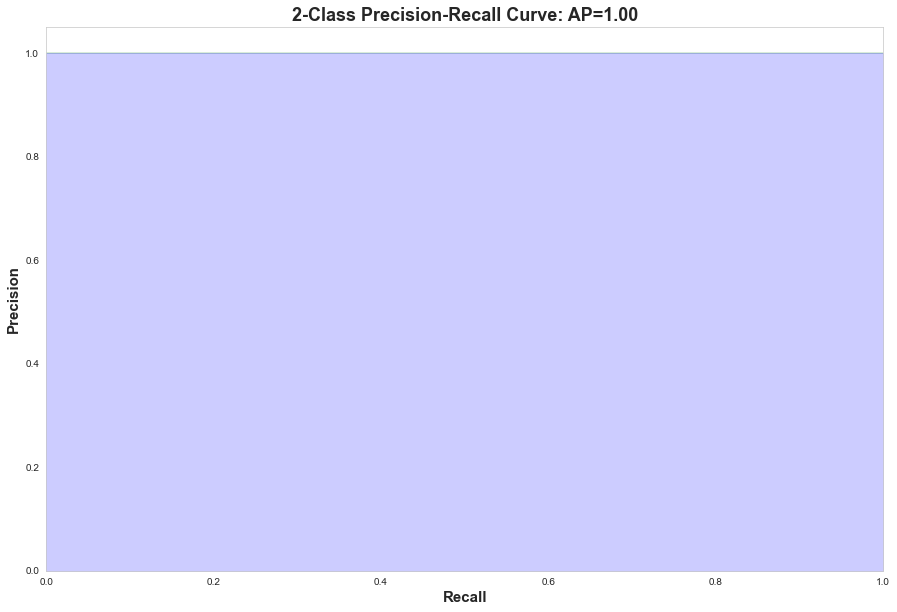

In [83]:
# precision recall curve
from sklearn.metrics import average_precision_score, precision_recall_curve
from funcsigs import signature

average_precision = average_precision_score(y_test, y_pred)

precision, recall, _ = precision_recall_curve(y_test, y_pred)

# using if statement for compatibility, matplotlib < 1.5, plt.fill_between does not use a 'step' argument
step_kwargs = ({'step': 'post'}
               if 'step' in signature(plt.fill_between).parameters
               else {})

plt.figure(1, figsize = (15, 10))
plt.step(recall, precision, color='g', alpha=0.2,
         where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b', **step_kwargs)

# plot design
plt.xlabel('Recall', weight='bold', fontsize=15)
plt.ylabel('Precision', weight='bold', fontsize=15)
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('2-Class Precision-Recall Curve: AP={0:0.2f}'.format(average_precision),  weight='bold', fontsize=18)
plt.show()

Since we have a highly imbalanced amount of positive to negative reviews, the best metric to use is the AUC PR (Area Under the Curve Precision Recall), or also called AP (Average Precision). From observing our results, we can see the precision decreases when we increase our recall. This means we must change the prediction threshold to suit our needs better. If we need a high recall, we can set a low prediction threshold so we can detect most of our positive observations albeit with low precision. If we want accurate predictions, we will miss some positive observations. In this case, a high threshold with low recall is required.

How do we know if our model will perform better with a better classifier? We can simply use an AP (Average Precision) metric. AP (Average Precision) is a popular metric in measuring the accuracy of object detectors like Faster R-CNN, SSD, etc. Average precision computes the average precision value for recall value over 0 to 1. To assess the quality of our model, we can compare it to a basic decision baseline such as a random classifier. This random classifier would predict 1 half of the time and 0 the other half of the time for the labels.

This would yield a precision of 4.3%, which corresponds to the proportion of positive observations. For each recall value, the precious will stay the same so the AP would be 0.043. The AP of our model is currenly 0.90-1.00 which is more than 20 times higher than the AP of the random method. This means our model has great predictive power.

It is possible to use just raw text as input for making predictions but the most important factor is being able to extract relevant features from the data. I would say it should be used as a complimentary source of data in order to extract more machine learning features to increase the predictive power of a current model.

Reference: https://towardsdatascience.com/detecting-bad-customer-reviews-with-nlp-d8b36134dc7e

<a id='results'></a>
## 5. Results

By using our 15 top numerical variables and 20 categorical variables, the obtained r2 score on the test data is 0.65, which isn't great. We've used a scatter plot to show a positive linear trend shown by our regression line. This means we have a positive correlation with our model. The main issue is that we have quite a lot of outliers indicating the lack of accuracy in our model. The accuracy tends to be better at prices below 150 USD since the prices are clustered more tightly together.

In our distribution plot we can see our model is accurate to around 150 USD similarly to the scatter plot. However, above 150 USD there is a massive spike in our model compared to the actual price. This also indicates a lack of accuracy at higher prices. We can try to improve the model further to see if we can increase the r2 score if required.

<a id='q1'></a>
### 5.1. Can we find out if a review will be positive or negative based on just text?
It is possible to use just raw text as input for making predictions but the most important factor is being able to extract relevant features from the data. I would say it should be used as a complimentary source of data in order to extract more machine learning features to increase the predictive power of a current model.

<a id='q2'></a>
### 5.2. What factors can affect listing prices?
We've found a few factors which can affect listing price:
- Location
- Privacy
- Comfort
- Superhosts

<a id='q3'></a>
### 5.3. How do those factors affect listing prices?
1. Location has a significant factor on price. The further out we go from the city center and its amenities we have to accept the price will fall due to lower demand. 

2. People don't like sharing much. We can see that most people opt for an entire home over a private room only. It seems people will pay more regardless to get more privacy as the cost savings are significant with private rooms.

3. Comfort is so important to customers and should be the primary focus once the above factors have been satisfied. The type and size of the bed can affect the quality of a customers sleep and overall experience.

4. Experienced Airbnb owners called 'Superhosts' can charge more than ones that aren't. They may also provide better services such as providing information on Boston's local culture or history or, personalising their customers experiences which could attract more business.

#### Map:

Below is a map of an estimate of the annual income of each property. Each plot represents a property, the larger the circle, the larger the annual income.

In [84]:
# limits of the map for further plots
bbox = ((bos_list.longitude.min(),   bos_list.longitude.max(),      
         bos_list.latitude.min(), bos_list.latitude.max()))

# creating column for occupation_365 by subtracting availibility_365 from 365
bos_list['availability_365'].isna().sum()
bos_list['occupation_365'] = np.subtract(365, bos_list['availability_365'])

# creating column for annual_income by multiplying by occupation_365
bos_list['annual_income'] = bos_list['occupation_365'] * bos_list['price']

# plot neighbourhood map
df = bos_list
color = px.colors.cyclical.Phase
fig = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="neighbourhood_cleansed", size="annual_income",
                  color_continuous_scale=px.colors.cyclical.Phase, size_max=50, zoom=10,
                  mapbox_style="carto-positron", title="Annual Income for Airbnbs around Boston")

# save fig
fig.write_html("px_annual_income.html")
fig.show()

<a id='deploy'></a>
## 6. Deploy

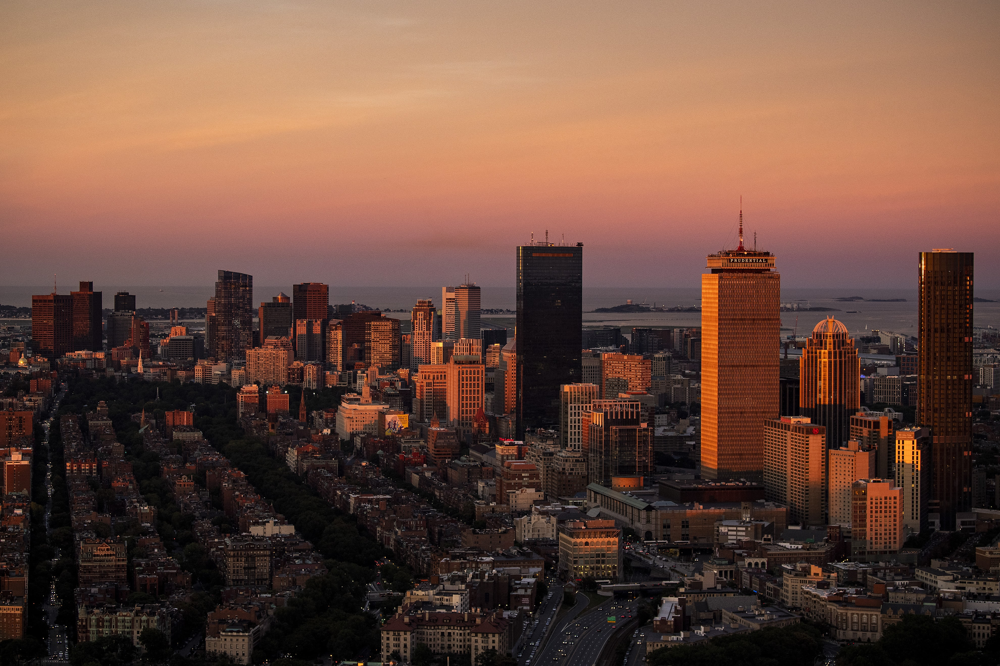

Our recommendation for a first time Airbnb home owner is to find a property in a location close to the city center. If budget is an issue then the next best thing would be to buy a property with good transport routes to the center. The next thing to think about is the type of property. It would be best to go for house as a first choice or an apartment as second choice, if budget permits.

The next most important thing to consider is whether to rent out the rooms or the home as a whole. From research, I think the best option is to rent out the home as a whole. There may be some risk in having periods of the home vacant instead of spreading the risk with multiple rooms. If the property has more than 3 rooms this may be a consideration.

Comfort is a very important part of the customers' experience in an Airbnb from our research so good beds should be considered. Being a Superhost seems to be a great benefit to exposure and potential profits since customers want great experiences. Being consistent and working on personalising customers' experiences should be the main focus when starting out as being a Superhost should be the objective.

In [85]:
# js toggle outputs
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')